## Notebook D1: Examining Cropland, Oil Wells and Select Health Outcomes in Kern County

This notebook explores cropland and the major crops cultivated in the County, begins exploring the relationship between cropland and oil and gas wells in the County, and the relationship between health outcomes and oil well locations in the County. It will also begin exploring how waterways and water infrastructure are distributed in the County to help explain some of the counterintuitive results, we're seeing between health and oil well locations (that worse health outcomes seem to be concentrated in areas in the east and north even though oil wells and croplands are concentrated in the west).

Kern County has major water projects and other infrastructure, like canals, running through the west side where all the oil and agriculture operations are concentrated, so I'll also begin exploring water infrastructure in the County.

In [1]:
## importing libraries

# reading data
import pandas as pd
import geopandas as gpd
import numpy as np
import fiona
import osmnx as ox

# plots/charts
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
    # pio.templates.default = "ggplot2"
    # options: seaborn, simple_white, plotly, plotly_white, plotly_dark
    # presentation, xgridoff, ygridoff, gridon, none

# maps
import contextily as ctx
import folium
import matplotlib.patches as mpatches #custom legends
#import collections

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


I first start by exploring cropland data, what's grown in the county. I'll then overlay oil well data onto crop type to get a sense of where the most water intensive crops (nuts, citrus, and grapes) are located relative to well locations to get a better sense of their vulnerability/risk of contamination from oil and gas wells.

In [4]:
## loading cropland data
crops = gpd.read_file('kern2022.zip')

In [5]:
## list of columns
crops.columns.to_list()

['DT_ACT',
 'P_STATUS',
 'PERMIT',
 'SITEID',
 'S_STATUS',
 'DT_INACT',
 'PMT_SITE',
 'OP_ACT',
 'OP_INACT',
 'PERMITTEE',
 'MAILING',
 'STATE',
 'TOWNSHIP',
 'RANGE',
 'PMT_YEAR',
 'COMM',
 'ACRES',
 'SECTION',
 'CITY',
 'AGENT',
 'ZIP',
 'geometry']

After reviewing the data, the columns I want to keep include PERMITTEE (Who owns the crop parcel), COMM (what the crop is), ACRES, CITY, and geometry.

In [6]:
## trimming data for desired columns
crops = crops[['PERMITTEE', 'COMM','ACRES','CITY','geometry']]
crops.sample()

,PERMITTEE,COMM,ACRES,CITY,geometry
3176,BEE SWEET CITRUS,ORANGE,32.0,FOWLER,"POLYGON ((6238023.189 2437480.575, 6238964.405..."


In [7]:
## renaming columns
crops.columns = ['Owner', 'Crop','Acres','City','geometry']
crops.sample()

,Owner,Crop,Acres,City,geometry
9508,GOYENETCHE DAIRY,CORN FOR/FOD,25.3,BUTTONWILLOW,"POLYGON ((6167649.838 2349726.738, 6168913.330..."


In [8]:
## exploring crops grown in the county
crops['Crop'].value_counts()

ALMOND             2636
PISTACHIO          1502
GRAPE              1216
UNCULTIVATED AG     969
ORANGE              673
                   ... 
STRAWBERRY            1
RAPE                  1
OT-PALM               1
MELON-ORGANIC         1
CORN, GRAIN           1
Name: Crop, Length: 183, dtype: int64

In [9]:
## turning "Crop" data into table by type
crop_counts = crops.value_counts(['Crop']).reset_index(name="Count")
crop_counts.head(10)

,Crop,Count
0,ALMOND,2636
1,PISTACHIO,1502
2,GRAPE,1216
3,UNCULTIVATED AG,969
4,ORANGE,673
5,WHEAT FOR/FOD,547
6,ALFALFA,512
7,TANGERINE/SDLS,437
8,CORN FOR/FOD,311
9,CARROT,305


It looks like Kern County is a grower of mostly nuts, grapes, citrus, and grains. I tried searching for what "uncultivated ag" referred to, but still have not found a clear answer. 

There are currently 182 different crop types, which makes knowing what's what on a map difficult. I'd like to create a "Crop Type" variable to sort crops in and make it easier to see what's being grown where exactly in Kern County. First I have to create a dictionary sorting crop by type, which I'll need to convert into a dataframe and merge to the existing crop geodataframe.

In [10]:
## creating dictionary: sorting 182 crops into crop types
croptype = {'Nut': ['ALMOND','PISTACHIO', 'ALMOND-ORGANIC','WALNUT','PISTACHIO-ORGANIC','PECAN'],
              'Fruit': ['STRAWBERRY','BLACKBERRY','MELON-ORGANIC','MANGO','APRICOT-ORGANIC','NECTARINE-ORGANIC','APPLE-ORGANIC','TANGELO-ORGANIC','GRAPE','ORANGE','TANGERINE/SDLS','GRAPE, WINE','LEMON','GRAPE-ORGANIC','CHERRY','TANGERINE','POMEGRANATE','GRAPE, RAISIN','GRAPEFRUIT','WATERMELON','ORANGE-ORGANIC','OLIVE','PEACH','TANGERINE-ORGANIC','APPLE','PERSIMMON','BLUEBERRY','TANGELO','NECTARINE','WATERMELON-ORGANIC','BLUEBERRY-ORGANIC','PLUM','GRAPE, WINE-ORGANIC','LIME','SQUASH','HONEYDEW MELON','APRICOT','GRAPEFRUIT-ORGANIC','CHERRY-ORGANIC','LEMON-ORGANIC','MUSK MELON','POMEGRANATE-ORGANIC','BLACKBERRY-ORGANIC','PEPPER SPICE','STRAWBERRY-ORGANIC','SQUASH, SUMMER','CANTALOUPE','GOOSEBERRY','PLUM-ORGANIC','JUJUBE','PEAR','PEACH-ORGANIC','GUAVA','PUMPKIN','SQUASH, WINTER-ORGANIC','AVOCADO','TOMATO-ORGANIC','PERSIMMON-ORGANIC','BITTER MELON','TOMATO SEED','GOURD','OLIVE-ORGANIC','CUCUMBER','ZUCCHINI'],
              'Vegetable': ['RADISH-ORGANIC','LETTUCE LEAF-ORGANIC','SWISS CHARD-ORGANIC','CUCUMBER-ORGANIC','PARSLEY-ORGANIC','CABBAGE-ORGANIC','FENNEL-ORGANIC','ONION SEED','CARROT','POTATO','TOMATO PROCESS','TOMATO','GARLIC','ONION DRY ETC','SWEET POTATO','POTATO-ORGANIC','BOK CHOY LSE LF','CABBAGE','SPINACH','BROCCOLI','CILANTRO','CAULIFLOWER','BEET','MUSTARD GREENS','PARSLEY','LETTUCE LEAF','PEPPER FRUITNG','DAIKON','PEAS','CARROT-ORGANIC','TOMATO PROCESS-ORGANIC','LETTUCE HEAD','ONION GREEN','BEAN DRIED','TURNIP','KOHLRABI','RADISH','KALE','MUSTARD','SAFFLOWER','SWISS CHARD','LETTUCE ROMAINE','GARLIC-ORGANIC','GAI LON TGHT HD','LETTUCE LEAF SD','GAI CHOY LSE LF','BEAN SUCCULENT','COLLARD','CELERY','DILL','EGGPLANT','LEEK','ARUGULA','NAPA CBG TGHT H','RUTABAGA','PEPPER FRUITNG-ORGANIC','DANDELION GREEN','FENNEL','CHIVE','BRUSSEL SPROUT','OP-PALM','SWEET BASIL','KALE-ORGANIC','RAPE (LEAFY VEG','CORN, SWEET','CILANTRO-ORGANIC','FAVA BEAN','BROCCOLI SEED','ASPARAGUS','OT-PALM','RAPE'],
              'Grain/Grass': ['CORN, GRAIN','WHEAT FOR/FOD','ALFALFA','CORN FOR/FOD','WHEAT','TRITICALE','OAT FOR/FOD','OAT','SORGHUM FOR/FOD','RYEGRAS FOR/FOD','BARLEY','SORGHUM MILO','INDUSTRIAL HEMP','WHEAT-ORGANIC','BARLEY FOR/FOD','OAT-ORGANIC','ALFALFA-ORGANIC','BERMUDA GRASS'],
              'Other': ['SUNFLOWER-ORGANIC','SOD FARM (TURF)','COTTON','PASTURELAND','OP-ROSE','COTTON PIMA','N-GRNHS PLANT','SUDANGRASS','FORAGE HAY/SLGE','N-OUTDR PLANTS','OT-DEC. TREE','OP-FLWRNG PLANT','OP-VINE','TURF/SOD','OP-DEC. TREE','RANGELAND','GT-DEC. TREE','CANNABIS (ALL OR UNSPECIFIED)','GP-FLWRNG PLANT','OF-BULB','OP-CHRSTMS TREE','GP-ROSE','UNCULTIVATED AG','UNCULTIVATED AG - ORGANIC'],}

In [11]:
## converting dictionary into a df
croptypedf = pd.DataFrame({'Group':croptype.keys(),'Crop':croptype.values()})
croptypedf

,Group,Crop
0,Nut,"[ALMOND, PISTACHIO, ALMOND-ORGANIC, WALNUT, PI..."
1,Fruit,"[STRAWBERRY, BLACKBERRY, MELON-ORGANIC, MANGO,..."
2,Vegetable,"[RADISH-ORGANIC, LETTUCE LEAF-ORGANIC, SWISS C..."
3,Grain/Grass,"[CORN, GRAIN, WHEAT FOR/FOD, ALFALFA, CORN FOR..."
4,Other,"[SUNFLOWER-ORGANIC, SOD FARM (TURF), COTTON, P..."


In [12]:
## expanding crop column so that each crop is assigned a type
croptypedf = croptypedf.explode('Crop', ignore_index=False)
croptypedf

,Group,Crop
0,Nut,ALMOND
0,Nut,PISTACHIO
0,Nut,ALMOND-ORGANIC
0,Nut,WALNUT
0,Nut,PISTACHIO-ORGANIC
...,...,...
4,Other,OF-BULB
4,Other,OP-CHRSTMS TREE
4,Other,GP-ROSE
4,Other,UNCULTIVATED AG


In [13]:
## creating new gdf joining crop gdf with croptypedf: assign a "type" to each crop
crops2 = crops.merge(croptypedf, how='left', on='Crop')
crops2.sample(5)

,Owner,Crop,Acres,City,geometry,Group
5843,"RICHARDSON FARMS, LLC",PEACH,121.1,BAKERSFIELD,"POLYGON ((6254355.295 2215650.547, 6256086.594...",Fruit
2154,HO SAI GAI FARMS INC,CABBAGE,35.0,BAKERSFIELD,"POLYGON ((6277642.787 2237396.417, 6277647.372...",Vegetable
6107,WATTS FARMING CO,ALMOND,151.0,BAKERSFIELD,"POLYGON ((6256457.304 2220628.199, 6259018.777...",Nut
4702,"WILDFLOWER VINEYARDS, LLC.",GRAPE,17.5,BAKERSFIELD,"POLYGON ((6254110.215 2219567.282, 6255227.736...",Fruit
190,TEJON RANCH/LAVAL FARMS,UNCULTIVATED AG,35.3,LEBEC,"POLYGON ((6363588.228 2278113.932, 6363582.776...",Other


In [14]:
## checking integrity of merge
print(crops.shape)
print(croptypedf.shape)
print(crops2.shape)

(12178, 5)
(183, 2)
(12178, 6)


One additional column in the new gdf. Seems like it worked! (Each crop has been assigned a type.) Now to visualize how much cropland is used for each crop type.

In [15]:
## creating table summing acreage by crop group
grouparea = crops2.groupby('Group')['Acres'].sum().reset_index(name='Acreage')
grouparea

,Group,Acreage
0,Fruit,192158.73
1,Grain/Grass,115678.94
2,Nut,398810.71
3,Other,103409.24
4,Vegetable,88394.66


In [16]:
## sorting by acreage
grouparea.sort_values(by='Acreage',ascending=False,inplace=True)
grouparea

,Group,Acreage
2,Nut,398810.71
0,Fruit,192158.73
1,Grain/Grass,115678.94
3,Other,103409.24
4,Vegetable,88394.66


Now to create an chart to visualize the table results. I want the color scheme for the bar chart to match the color scheme on the legend for the map.

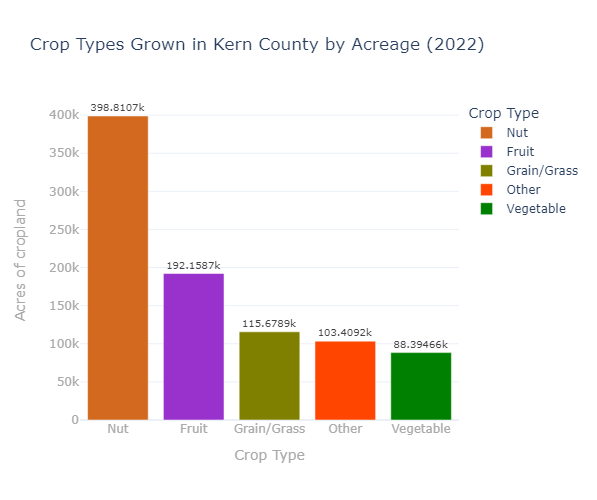

In [17]:
## interactive plot
# template
pio.templates.default = "plotly_white"

fig = px.bar(grouparea,
        x='Group',
        y='Acreage',
        title="Crop Types Grown in Kern County by Acreage (2022)",
        text_auto = True,
        height=500,
        width=750,
        color='Group',
        color_discrete_map={'Nut':'chocolate', 'Fruit':'darkorchid', 'Grain/Grass':'olive', 'Other':'orangered', 'Vegetable':'green'},
        #color_discrete_sequence =['#1b4d3e']*len(grouparea),
        labels={
                'Acreage': 'Acres of cropland',
                'Group': 'Crop Type',
        })

# bar label
fig.update_traces(textposition='outside',textfont_size=10,textfont_color='#444')

# axes labels
fig.update_yaxes(title_font_size=14,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=12)
fig.update_xaxes(title_font_size=14,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=12)

# show
fig.show()

# saving
fig.write_html("cropgroupchart2.html")

With this chart, it's easy to tell that croplands cultivated for "nuts" -- the most water intensive of the crops grown -- make up about half of all agricultural land in the county. Now to map the distribution of crop types. I'll need to use the merged oil well and CalEnviroScreen data (the documentation for the merge being completed in NOTEBOOK C) for census tract boundaries.

Now to map the results.

In [18]:
## loading oil wells and CalEnvironscreen data
oilenv = gpd.read_file('OilCES4.geojson')

In [19]:
crops2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 12178 entries, 0 to 12177
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   Owner     12178 non-null  object  
 1   Crop      12178 non-null  object  
 2   Acres     12178 non-null  float64 
 3   City      12178 non-null  object  
 4   geometry  12178 non-null  geometry
 5   Group     12178 non-null  object  
dtypes: float64(1), geometry(1), object(4)
memory usage: 666.0+ KB


In [20]:
## checking projection
print(crops2.crs)
print(oilenv.crs)

epsg:2229
epsg:3857


In [21]:
## changing projection
crops2 = crops2.to_crs("EPSG:4326")
oilenv = oilenv.to_crs("EPSG:4326")

In [22]:
## importing libraries for custom colors in legends
from matplotlib import cm 
from matplotlib.colors import ListedColormap,LinearSegmentedColormap

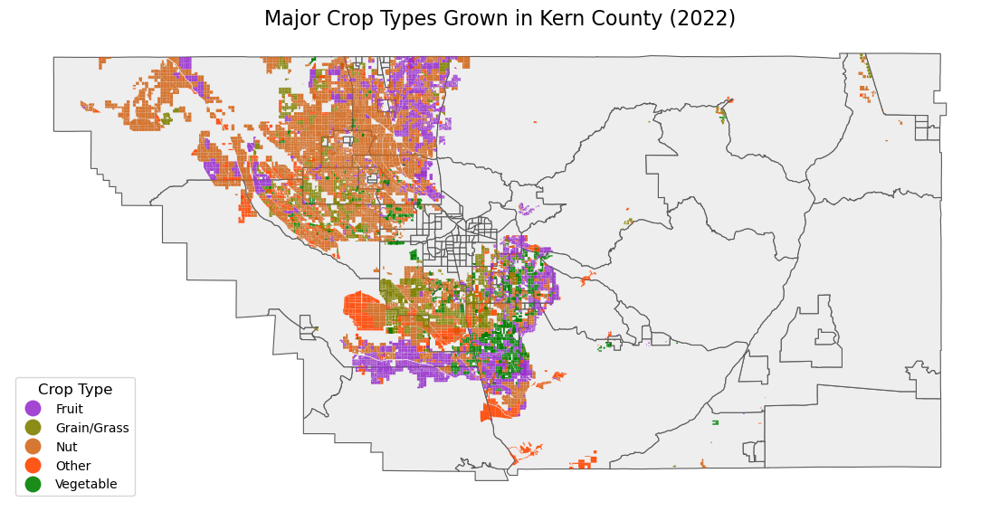

In [23]:
## map with census tract border overlays
fig, ax=plt.subplots(figsize=(14,12))

oilenv.plot(ax=ax,
            facecolor='#eee',
            edgecolor='#5A5A5A',
            lw=.8)

crops2.plot(ax=ax,
                    column='Group',
                    legend=True,
                    cmap = ListedColormap(['darkorchid', 'olive', 'chocolate', 'orangered', 'green']),
                    legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'medium'},
                    alpha=.9)

ax.axis('off')
ax.set_title("Major Crop Types Grown in Kern County (2022)",fontsize=16)
ax.get_legend().set_title("Crop Type")

This is much better visually to get a sense of what's being grown where. The original map had 182 different crop types (and an unwieldy legend to match). Now we can see that most of the croplands cultivated for nuts are in the northwest, while grains/grasses and vegetables are cultivated in the southwest. There's also a section of fruit cropland that seems to be grown in the census tract that has almost half of all the oil wells in Kern County located on it (visualized in NOTEBOOK C; visualized again later in the interactive map in this notebook). Yikes.

Now to overlay the oil well locations. But first, I'll have to pull and sort the raw well data (which is a large dataset) for the necessary locations.

In [24]:
## Pulling raw Kern County oil well data from group repo
kern_wells = pd.read_csv('https://raw.githubusercontent.com/ybecerra29/up221groupproject/main/kern_county_oil.csv')

In [25]:
## Examining well type
kern_wells['WellType'].value_counts()

OG       103604
SC        20070
SF        11508
WF         6996
OB         4228
DH         3481
Multi      2046
WD         1602
INJ         929
CH          611
DG          477
UNK         288
WS          141
PM          125
GD          115
AI           64
GAS          18
GS            9
LG            1
Name: WellType, dtype: int64

Based on this [CA Dept of Conservation (DOC) metadata doc](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), I'm limiting the Well Type included to OG (Oil and Gas) since the number of other relevant well types (GAS (Gas Well), LG (Liquid Gas), and DG (Dry Gas)) are so small in comparison.

In [26]:
## Examining the status of the wells in the County
kern_wells['WellStatus'].value_counts()

Plugged        71548
Active         46049
Idle           27930
Canceled        8355
New             2251
PluggedOnly      147
Unknown           33
Name: WellStatus, dtype: int64

Again, after consulting the [DOC metadata doc](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), I am cropping the "Canceled" wells. All other types, even the "Idle" wells have been drilled and or are capable of operations. Since we don't have time series data on oil wells, the safest thing is to assume that regardless of whether they are active as of this year, their presence alone and previous activities have probably had some kind of cumulative impact on health in some way in the County.

In [27]:
## Subsetting data for Oil and Gas wells
kern_OGwells = kern_wells[kern_wells['WellType'] == 'OG']
kern_OGwells.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103604 entries, 0 to 156312
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   LeaseName   103604 non-null  object 
 1   WellDesign  103604 non-null  object 
 2   WellStatus  103604 non-null  object 
 3   WellType    103604 non-null  object 
 4   WellTypeLa  103604 non-null  object 
 5   OperatorNa  103604 non-null  object 
 6   Place       103604 non-null  object 
 7   CountyName  103604 non-null  object 
 8   Latitude    103604 non-null  float64
 9   Longitude   103604 non-null  float64
 10  GISSource   103604 non-null  object 
 11  isDirectio  103604 non-null  object 
 12  WellSymbol  103604 non-null  object 
dtypes: float64(2), object(11)
memory usage: 11.1+ MB


In [28]:
## Dropping "Canceled" wells from dataset
kern_OGwells = kern_OGwells[kern_OGwells.WellStatus != 'Canceled']

Trimming the columns down to only what I need.

In [29]:
kern_OGwells.columns.to_list()

['LeaseName',
 'WellDesign',
 'WellStatus',
 'WellType',
 'WellTypeLa',
 'OperatorNa',
 'Place',
 'CountyName',
 'Latitude',
 'Longitude',
 'GISSource',
 'isDirectio',
 'WellSymbol']

In [30]:
## Trimming columns
kern_OGwells = kern_OGwells[['OperatorNa', 'WellStatus','WellType','Latitude','Longitude']]
kern_OGwells.sample()

,OperatorNa,WellStatus,WellType,Latitude,Longitude
118620,Aera Energy LLC,Active,OG,35.102985,-119.465385


In [32]:
## Renaming columns
kern_OGwells.columns = ['Operator', 'WellStatus','WellType','Latitude','Longitude']
kern_OGwells.sample()

,Operator,WellStatus,WellType,Latitude,Longitude
69868,California Resources Production Corporation,Plugged,OG,35.486755,-119.035652


In [33]:
## status of the remaining wells in the data
kern_OGwells['WellStatus'].value_counts()

Plugged        55058
Active         23491
Idle           16718
New             1337
PluggedOnly      102
Unknown           21
Name: WellStatus, dtype: int64

Imporant to note -- there seem to be more "Plugged" than "Active" wells -- which, according to the [DOC](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), "represents plugged and abandoned wells that are permanently sealed."

Now to convert data into geodata for a map.

In [34]:
## converting df into gdf
kern_wellsgeo = gpd.GeoDataFrame(kern_OGwells, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(kern_OGwells.Longitude, kern_OGwells.Latitude))

Before overlaying the oil well locations onto the cropland map, I want to look at how oil wells are distributed by status in the County.

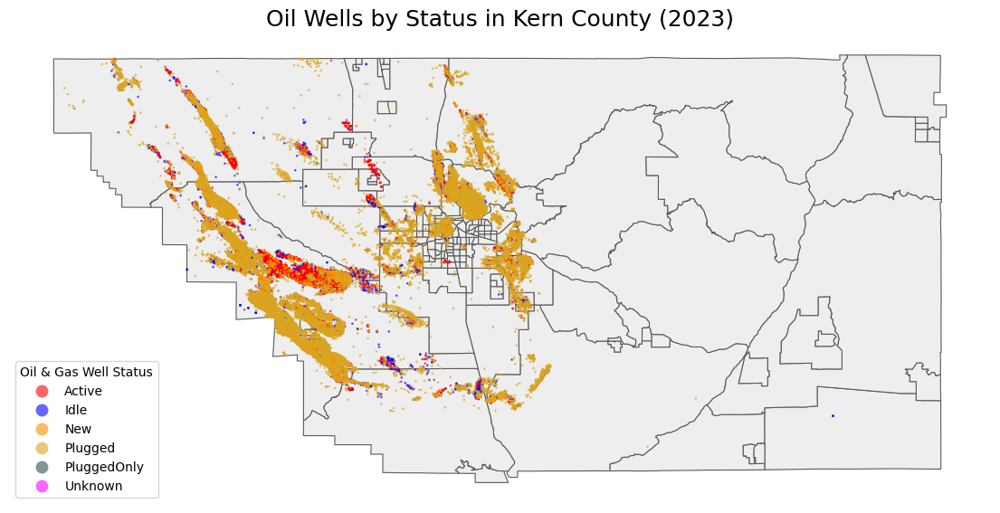

In [35]:
## static map: oil well locations by status
fig, ax = plt.subplots(figsize=(14,12))

# census tracts
oilenv.plot(ax=ax,
            facecolor='#eee',
            edgecolor='#5A5A5A',
            lw=.8)

# wells
kern_wellsgeo.plot(ax=ax,
                   column='WellStatus',
                   marker='.',
                   markersize=3,
                   cmap = ListedColormap(['red', 'blue', 'darkorange', 'goldenrod', 'darkslategrey','magenta']),
                   legend=True,
                   legend_kwds={'loc': 'lower left'},
                   alpha=.6)

ax.axis('off')
ax.set_title('Oil Wells by Status in Kern County (2023)',fontsize=18)
ax.get_legend().set_title("Oil & Gas Well Status")

This map shows that most of the wells are plugged, but they seem to be obscuring the "Active" wells. Now to overlay oil wells by status onto the cropland data (without distinction between crop types, since that would just be too much data on one map).

Text(0.5, 1.0, 'Locations of Oil and Gas Wells (by Status) and Cropland in Kern County (2022)')

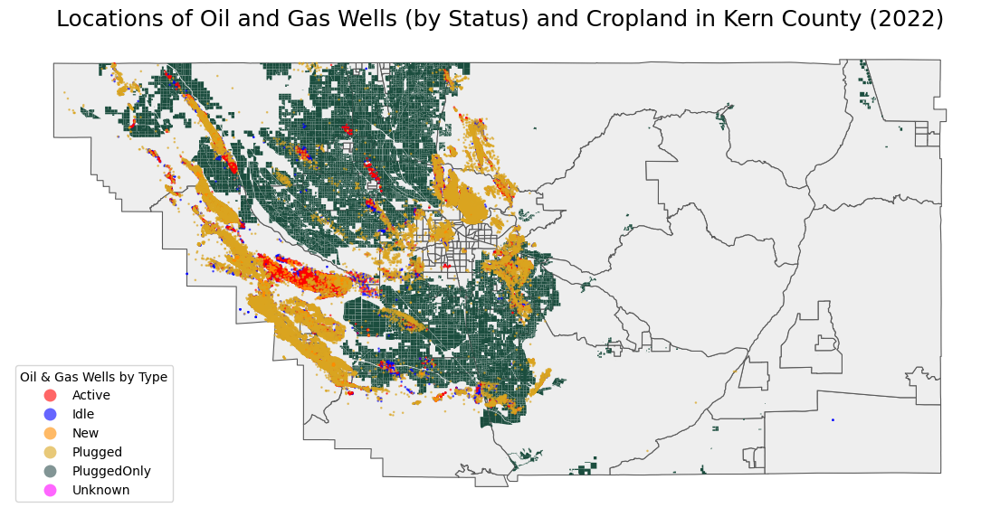

In [36]:
## Adding oil well locations by status to cropland on the map
fig, ax = plt.subplots(figsize=(14,12))

# census tract
oilenv.plot(ax=ax,
            facecolor='#eee',
            edgecolor='#5A5A5A',
            lw=.8)

## crops
crops2.plot(ax=ax, 
       marker='.',
       markersize=6,
       color='#1b4d3e')
       #color='olive')

## OG wells layer
kern_wellsgeo.plot(ax=ax,
                   column='WellStatus',
                   marker='.',
                   markersize=3,
                   cmap = ListedColormap(['red', 'blue', 'darkorange', 'goldenrod', 'darkslategrey','magenta']),
                   legend=True,
                   legend_kwds={'loc': 'lower left'},
                   alpha=.6)

ax.axis('off')
ax.get_legend().set_title("Oil & Gas Wells by Type")
ax.set_title('Locations of Oil and Gas Wells (by Status) and Cropland in Kern County (2022)',fontsize=18,pad=10)
# plt.savefig("Kern_Crops_and_OGwellsall.jpg")

It's easy to see that oil wells and cropland are concentrated near each other -- which makes a lot of sense since (as we'll see later) a lot of major waterways and water infrastructure (mostly canals) are located in this area, and farmers and oil and gas operators need water to irrigate croplands and to extract oil and gas from the ground. Naturally, they'd locate where all the water is found.

Now I'll overlay the crop by type data with the wells data on a map (using the color scheme from the bar chart from above) to get a sense of which crop types are closest to oil wells.

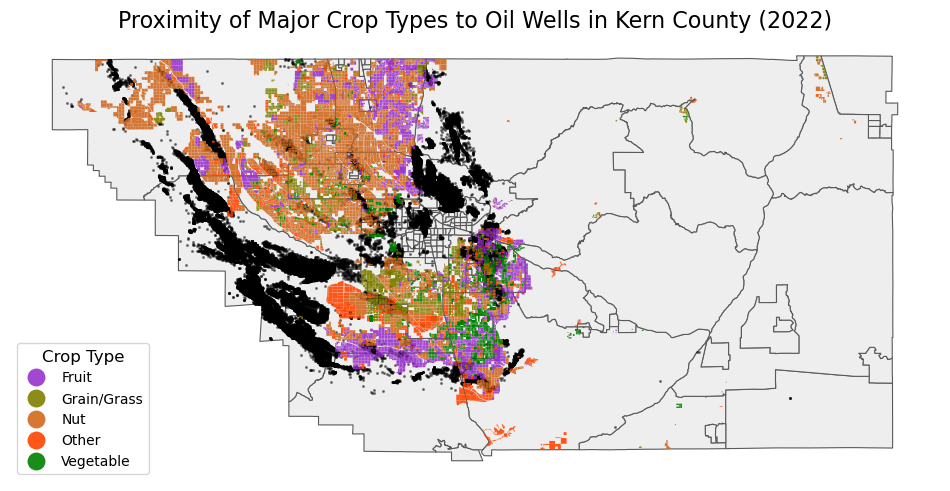

In [38]:
## crops and wells
fig, ax=plt.subplots(figsize=(12,10))

# census tract borders
oilenv.plot(ax=ax,
            facecolor='#eee',
            edgecolor='#5A5A5A',
            lw=.8)

# oil wells: specified by type
kern_wellsgeo.plot(ax=ax,
           marker='.',
           markersize=6,
           color='black',
           alpha=.4)

# crops
crops2.plot(ax=ax,
                    column='Group',
                    legend=True,
                    cmap = ListedColormap(['darkorchid', 'olive', 'chocolate', 'orangered', 'green']),
                    legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'medium'},
                    alpha=.9)

ax.axis('off')
ax.set_title("Proximity of Major Crop Types to Oil Wells in Kern County (2022)",fontsize=16)
ax.get_legend().set_title("Crop Type")

# saving
plt.savefig("wellsandcropsbygroup.jpg", bbox_inches ='tight')

## Looking at the Relationship Between Oil and Gas Wells and Health Outcomes

The previous notebooks included maps exploring the individual demographic, health, and even oil well densities in specific census tracts in the County. Now to overlay these maps together in an interactive map to get a sense of how these outcomes relate to each other.

In [39]:
## adjusting projection of the geodataframe that will be used for the folium map
oilenv_mercator = oilenv.to_crs(3857)

In [40]:
## Creating "toggle-able" layers
Kern = folium.Map(location=[35.4,-118.8], 
               zoom_start = 8,
               tiles=None,
               overlay=False)

## FAILING to add a poor man's title, code works but image is not showing up properly
## from folium.plugins import FloatImage
## image_file ='Kern Map Title_small.png'
## FloatImage(image_file, bottom=86, left=10).add_to(Kern)

fg1 = folium.FeatureGroup(name='Density of Oil & Gas Well Locations',overlay=False).add_to(Kern)
fg2 = folium.FeatureGroup(name='Pesticide Use (lb. per square mile)',overlay=False).add_to(Kern)
fg3 = folium.FeatureGroup(name='Population Count',overlay=False).add_to(Kern)
fg4 = folium.FeatureGroup(name='Incidence of Low Birth Weight',overlay=False).add_to(Kern)
fg5 = folium.FeatureGroup(name='Asthma Rate per 10K residents',overlay=False).add_to(Kern)
fg6 = folium.FeatureGroup(name='Cardiovascular Disease Rate per 10K residents',overlay=False).add_to(Kern)

In [41]:
## adding OG wells layer
custom_scale1 = (oilenv_mercator['Count'].quantile((0,0.3,0.75,0.95,0.999,1))).tolist()
OGwells=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS', 'Count'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale1,
            fill_color='YlOrRd',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend=True,
            legend_name='Oil & Gas Well Density',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg1)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Oil & Gas Well Locations in Kern County (2023)',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Count',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Oil & Gas Wells:",
                                 "City/Area:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(OGwells) 

In [42]:
## Pesticide layer
custom_scale2 = (oilenv_mercator['Pesticide'].quantile((0,0.5,0.75,0.85,0.95,1))).tolist()
Pesticide=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','Pesticide'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale2,
            fill_color='Reds',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend=True,
            legend_name='Pesticide Use (lb./square mile)',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg2)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Pesticide Use (lb./square mile) in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Pesticide',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Pound/square mile:",
                                 "City/Area:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Pesticide) 

In [43]:
## adding Population layer
custom_scale3 = (oilenv_mercator['TotPop19'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Population=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','TotPop19'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale3,
            fill_color='Blues',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend=True,
            legend_name='Population Count',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg3)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Number of Residents by Census Tract in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'TotPop19',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Residents:",
                                 "City/Area:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Population) 

In [44]:
## low birthweight layer
custom_scale4 = (oilenv_mercator['LowBirtWt'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Lowbirthweight=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','LowBirtWt'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale4,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend=True,
            legend_name='Population Count',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg4)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Incidence of Low Birth Weight in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'LowBirtWt',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Percentage of Births:",
                                 "City/Area:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Lowbirthweight) 

In [45]:
## Asthma layer
custom_scale5 = (oilenv_mercator['Asthma'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Asthma=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','Asthma'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale5,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend=True,
            legend_name='Rates of Asthma',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg5)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Rates of Asthma per 10,000 residents in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Asthma',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Asthma Rate:",
                                 "City/Area"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Asthma) 

In [46]:
## Cardio disease layer
custom_scale6 = (oilenv_mercator['Cardiovas'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Cardio=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','Cardiovas'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale6,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend=True,
            legend_name='Rates of Cardiovascular Disease',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg6)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Rates of Cardiovascular Disease per 10,000 residents in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Cardiovas',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Cardiovascular Disease Rate:",
                                 "City/Area:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Cardio) 

In [47]:
## Adding layer control
# folium.TileLayer('Stamen Toner',overlay=True).add_to(Kern)
folium.TileLayer('cartodbpositron',overlay=True).add_to(Kern)
folium.LayerControl(collapsed=True).add_to(Kern)
Kern

In [48]:
## saving
Kern.save("OilgaswellsandhealthKern2.html")

Now that we have all the indicator layered together, we can see that oil well density (and pesticide use detected) does not correspond directly to health outcomes in specfic census tracts. This is likely because (1) with the exception of the cities of the metro center (e.g. Bakersfield), people seem to be concentrated in the eastern portion of the County (e.g. California City), and (2) it's possible that health outcomes might also be related to how the County's waterways and water infrastructure might be distributing water, and as a result the waste from oil and agriculture activities, throughout the County.

## Mapping Waterways and Water Infrasctructure in Kern County

Let's first start by actually looking at where cities have been established in the County, and the relationship to the canals in the County. It might be informative to compare with the "Population" layer in the folium map.

In [49]:
## loading city limits
city = gpd.read_file('City_Limits.shp')

In [50]:
## loading canals data
canals = gpd.read_file('Canals_Kern_24k.shp')

In [51]:
## inspecting
city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 39 entries, 0 to 38
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   Munici_ID  39 non-null     object  
 1   Label      17 non-null     object  
 2   geometry   39 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 1.0+ KB


In [52]:
## inspecting
canals.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   FNODE_      64 non-null     int64   
 1   TNODE_      64 non-null     int64   
 2   LPOLY_      64 non-null     int64   
 3   RPOLY_      64 non-null     int64   
 4   LENGTH      64 non-null     float64 
 5   CANAL24CA_  64 non-null     int64   
 6   CANAL24CA1  64 non-null     int64   
 7   CANAL       53 non-null     object  
 8   FED         64 non-null     int64   
 9   STATE       64 non-null     int64   
 10  geometry    64 non-null     geometry
dtypes: float64(1), geometry(1), int64(8), object(1)
memory usage: 5.6+ KB


In [53]:
## checking projection
print(city.crs)
print(canals.crs)

epsg:2229
epsg:2229


In [54]:
## adjusting projection
city = city.to_crs("EPSG:4326")
canals = canals.to_crs("EPSG:4326")

In [55]:
city.sample(3)

,Munici_ID,Label,geometry
30,ISLAND,None,"POLYGON ((-118.98099 35.31408, -118.98098 35.3..."
11,ISLAND,None,"POLYGON ((-119.12312 35.28943, -119.12312 35.2..."
2,CITY OF TEHACHAPI,Tehachapi,"POLYGON ((-118.55292 35.10925, -118.55740 35.1..."


What cities are included in this data?

In [56]:
## inspecting muni ID
city['Munici_ID'].to_list()

['CITY OF WASCO',
 'CITY OF MARICOPA',
 'CITY OF TEHACHAPI',
 'CITY OF ARVIN',
 'CITY OF CALIFORNIA CITY',
 'CITY OF DELANO',
 'CITY OF DELANO',
 'CITY OF DELANO',
 'CITY OF SHAFTER',
 'CITY OF SHAFTER',
 'CITY OF SHAFTER',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'CITY OF TAFT',
 'ISLAND',
 'ISLAND',
 'CITY OF TEHACHAPI',
 'ISLAND',
 'CITY OF BAKERSFIELD',
 'ISLAND',
 'ISLAND',
 'CITY OF MCFARLAND',
 'ISLAND',
 'CITY OF RIDGECREST',
 'ISLAND',
 'CITY OF BAKERSFIELD']

Now to map the cities.

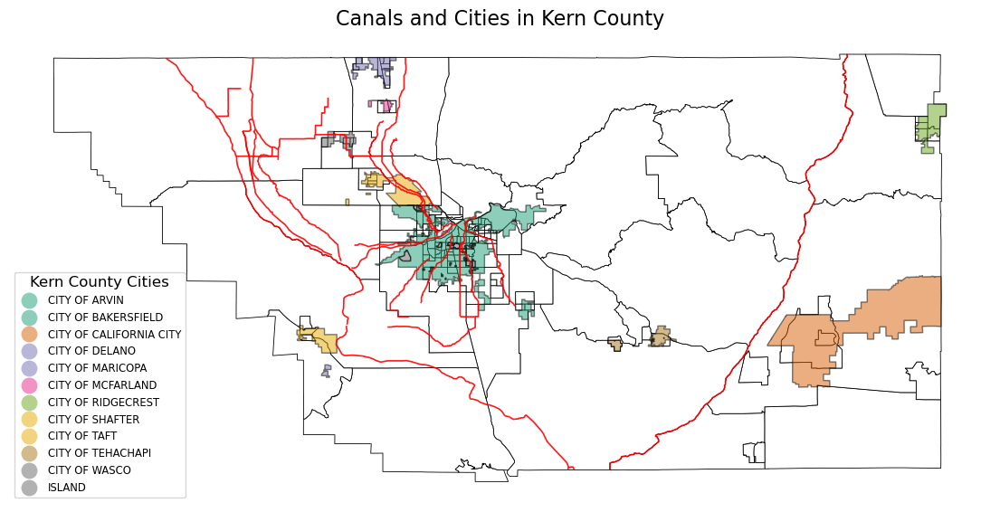

In [58]:
## cities map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)
# cities
city.plot(ax=ax,
                   column='Munici_ID',
                   legend=True,
                   legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
                   cmap='Dark2',
                   edgecolor='black',
                   lw=1,
                   alpha=0.5)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.2,
            color='red',
            alpha=0.9)

ax.axis('off')
ax.set_title("Canals and Cities in Kern County",fontsize=16)
ax.get_legend().set_title("Kern County Cities")

# saving
#plt.savefig("Canalsandcities.jpg", bbox_inches ='tight')

It's helpful to see where all the cities are -- so much of the County is unincorporated. 

I think "Island" corresponds to the [Kern Island Canal](https://meyerce.net/kern-island-canal). (It seems to be located in Bakersfield, and when the cities were remapped to include only the locations named "Island", they were all concentrated near the Bakersfield area.)

It looks like most of the canals are in the western portion of the county where all the major cities and cropland and oil and gas wells are concentrated.

Now, we can begin exploring where all the other waterways and water infrastructure in the County are -- in hopes that it might begin to help explain some of the counterintuitive findings in the interactive map.

In [64]:
## loading files for other waterways and infrastructure

# water infrastructure (includes more comprehensive data than "canals" but is a json file); not sure how to convert
watercourse = gpd.read_file('berkeley-s74962-geojson.json')

# watershed gdf
watershed = gpd.read_file('EPA_Surf_Your_Watershed_[ds732].geojson')

In [65]:
## checking projections
print(watercourse.crs)
print(watershed.crs)

epsg:4326
epsg:4326


In [66]:
## adjusting projections
watercourse = watercourse.to_crs("EPSG:4326")
watershed = watershed.to_crs("EPSG:4326")

Now to map the watersheds. But before the watershed data can be mapped, it needs to be clipped to include only the watersheds in Kern County, since, as it is, it includes data for all CA watersheds.

In [67]:
## clipping state watershed boundaries using Kern County boundaries
kernwatershed = gpd.clip(watershed, oilenv)

/opt/conda/lib/python3.10/site-packages/geopandas/tools/clip.py:67: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



In [68]:
## checking results
print(watershed.shape)
print(kernwatershed.shape)

(165, 7)
(15, 7)


There are 15 watersheds within Kern County. Let's get them on a map. I'll be selecting custom colors since the default color map palettes arbitrarily assigns colors that seem busy to the eye.

Text(0.5, 1.0, 'Watersheds and Canals in Kern County')

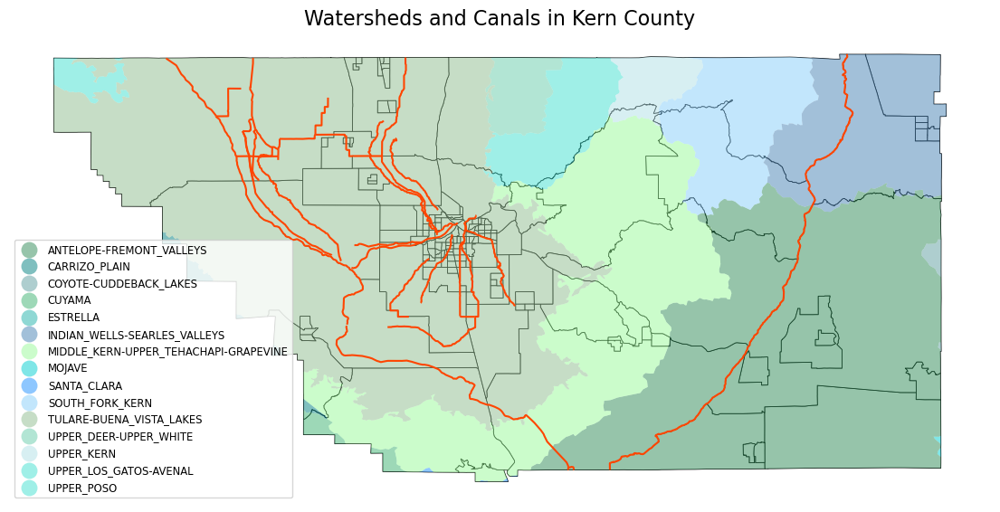

In [70]:
## overlaying watersheds onto map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)

# watersheds
kernwatershed.plot(ax=ax,
                   column='CUNAME',
                   legend=True,
                   legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'medium', 
                                 'fontsize':'small'},
                   cmap = ListedColormap(['seagreen', 'teal', 'cadetblue', 'mediumseagreen', 'lightseagreen','steelblue', 'palegreen', 'darkturquoise', 'dodgerblue', 'lightskyblue', 'darkseagreen', 'mediumaquamarine', 'powderblue','turquoise']),
                   alpha=0.5)

# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.5,
            color='orangered',
            alpha=1)

ax.axis('off')
ax.set_title("Watersheds and Canals in Kern County",fontsize=16)
#ax.get_legend().set_title("Watershed")

Based on the previous maps, it looks one watershed, the Tulare-Buena Vista Lakes Watershed (color: greyish-green), is where all the oil and gas well and agricultural activity is concentrated. This watershed also houses most of the canals delivering water to and from the different watersheds and the state water projects to irrigate cropland and to support oil and gas well operations. 

At the same time, it's useful to note that the second most dense population center in the County -- California City -- where some of the worse health outcomes are concentrated or near rests on top of the Antelope-Fremont Valleys Watershed (color: dark grey-green)

Let's overlay (1) the oil well data and (2) cropland data just to get a spatial sense of this relationship. 

Text(0.5, 1.0, 'Oil Wells, Canals, and Watersheds in Kern County')

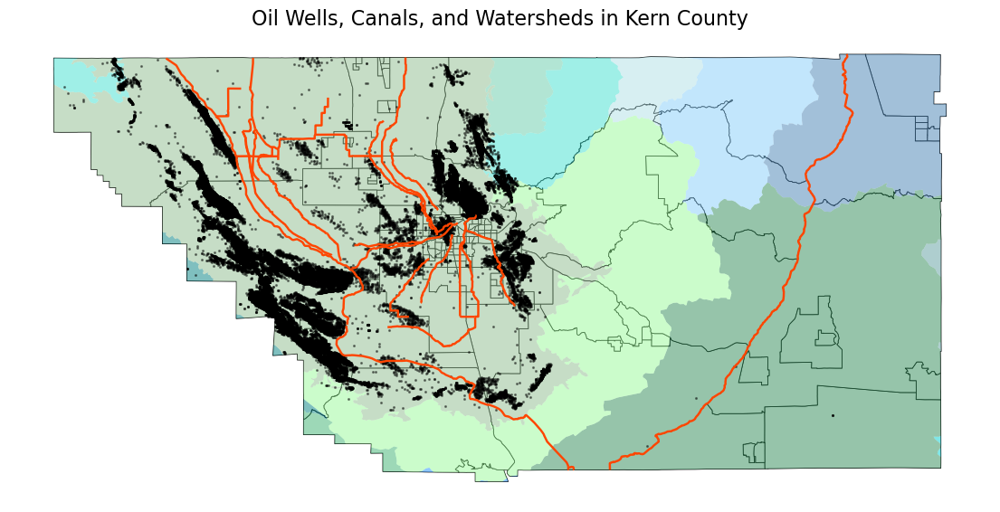

In [71]:
## overlaying oil wells onto map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)

# watersheds
kernwatershed.plot(ax=ax,
                   column='CUNAME',
                   legend=False,
                   cmap = ListedColormap(['seagreen', 'teal', 'cadetblue', 'mediumseagreen', 'lightseagreen','steelblue', 'palegreen', 'darkturquoise', 'dodgerblue', 'lightskyblue', 'darkseagreen', 'mediumaquamarine', 'powderblue','turquoise']),
                   alpha=0.5)

# OG wells
kern_wellsgeo.plot(ax=ax,
           marker='.',
           markersize=6,
           color='black',
           alpha=.4)

# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.75,
            color='orangered',
            alpha=1)

ax.axis('off')
ax.set_title("Oil Wells, Canals, and Watersheds in Kern County",fontsize=16)

Text(0.5, 1.0, 'Oil Wells, Cropland, and Watersheds in Kern County')

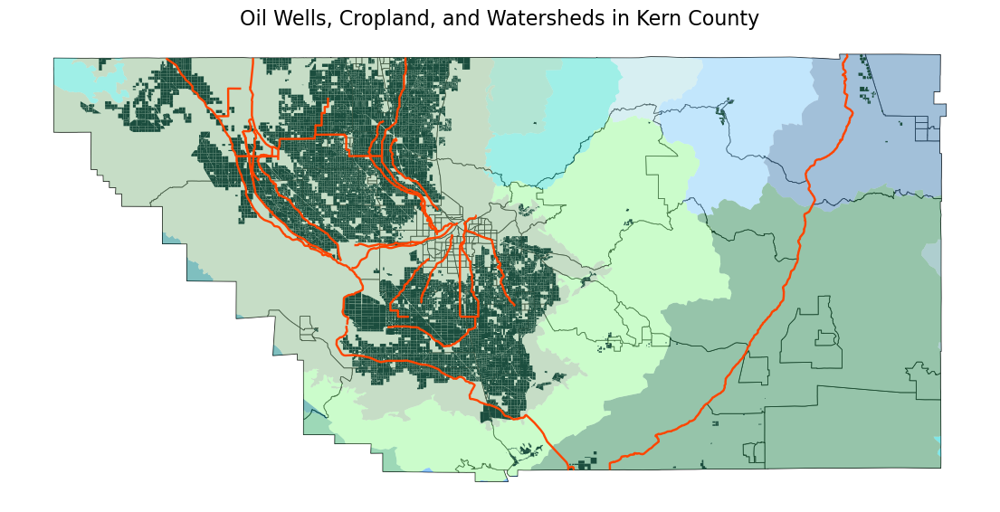

In [72]:
## overlaying cropland onto map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)

# watersheds
kernwatershed.plot(ax=ax,
                   column='CUNAME',
                   legend=False,
                   cmap = ListedColormap(['seagreen', 'teal', 'cadetblue', 'mediumseagreen', 'lightseagreen','steelblue', 'palegreen', 'darkturquoise', 'dodgerblue', 'lightskyblue', 'darkseagreen', 'mediumaquamarine', 'powderblue','turquoise']),
                   alpha=0.5)

# crops
crops2.plot(ax=ax,
               marker='o',
               markersize=4,
               color='#1b4d3e')
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.75,
            color='orangered',
            alpha=1)

ax.axis('off')
ax.set_title("Oil Wells, Cropland, and Watersheds in Kern County",fontsize=16)

I want to set them together in a side-by-side map so it's easier to visually compare and to create a custom legend that is not as busy as the default that is created using the data from the geodataframe.

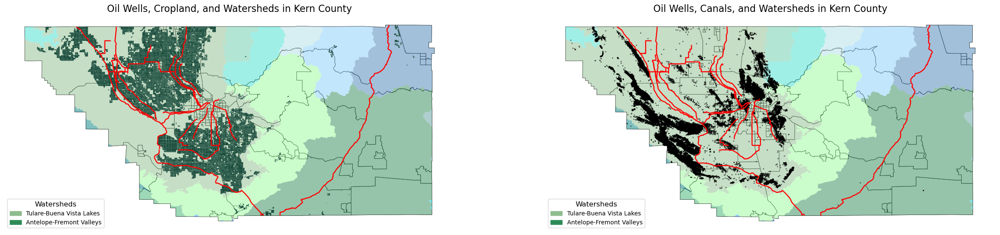

In [73]:
## side-by-side
fig, axs = plt.subplots(1, 2, figsize=(30,14), sharex=True, sharey=True)
ax1, ax2 = axs

# custom legend
Antelope = mpatches.Patch(color='seagreen', label='Antelope-Fremont Valleys')
Tulare = mpatches.Patch(color='darkseagreen', label='Tulare-Buena Vista Lakes')

## ax1
# tracts
oilenv.plot(ax=ax1,
            facecolor='white',
            edgecolor='black',
            lw=0.6)

# watersheds
kernwatershed.plot(ax=ax1,
                   column='CUNAME',
                   legend=False,
                   cmap = ListedColormap(['seagreen', 'teal', 'cadetblue', 'mediumseagreen', 'lightseagreen','steelblue', 'palegreen', 'darkturquoise', 'dodgerblue', 'lightskyblue', 'darkseagreen', 'mediumaquamarine', 'powderblue','turquoise']),
                   alpha=0.5)

# crops
crops2.plot(ax=ax1,
               marker='o',
               markersize=4,
               color='#1b4d3e')

# canals
canals.plot(ax=ax1,
            linestyle='solid',
            linewidth=1.75,
            color='red',
            alpha=1)

ax1.axis('off')
ax1.set_title("Oil Wells, Cropland, and Watersheds in Kern County",fontsize=16)
ax1.legend(handles=[Tulare, Antelope], loc='lower left', bbox_to_anchor= (0, 0), markerscale= 1.29, title= 'Watersheds', title_fontsize=12, fontsize=10, fancybox=True)

## ax2
# tracts
oilenv.plot(ax=ax2,
            facecolor='white',
            edgecolor='black',
            lw=0.6)

# watersheds
kernwatershed.plot(ax=ax2,
                   column='CUNAME',
                   legend=False,
                   cmap = ListedColormap(['seagreen', 'teal', 'cadetblue', 'mediumseagreen', 'lightseagreen','steelblue', 'palegreen', 'darkturquoise', 'dodgerblue', 'lightskyblue', 'darkseagreen', 'mediumaquamarine', 'powderblue','turquoise']),
                   alpha=0.5)

# OG wells
kern_wellsgeo.plot(ax=ax2,
           marker='.',
           markersize=6,
           color='black',
           alpha=.4)

# canals
canals.plot(ax=ax2,
            linestyle='solid',
            linewidth=1.75,
            color='red',
            alpha=1)

ax2.axis('off')
ax2.set_title("Oil Wells, Canals, and Watersheds in Kern County",fontsize=16)
ax2.legend(handles=[Tulare, Antelope], loc='lower left', bbox_to_anchor= (0, 0), markerscale= 1.29, title= 'Watersheds', title_fontsize=12, fontsize=10, fancybox=True)


# saving
plt.savefig("Canalscropswells.jpg", bbox_inches ='tight')

As expected, almost all oil and gas wells and cropland are contained within the Tulare-Buena Vista Lakes Watershed. To get a better sense of how the waste from the oil well and agricultural activities in this watershed might be distributed to/impact the other areas of the county, we'll need more data about other types of infrastructure that deliver water to and from different areas of the county, the direction of the water delivery/travel flows, and to get a better sense of how the different water districts provide service to both the cities and unincorporated areas of the County. 

The "watercourse" data is in a .json file I was not able to figure out how to convert into .geojson format to map. But it still contains useful data about the few other other types of water infrastructure in the County (like the rivers). It might be helpful to render this data in table form, since it's not helpful when mapped.

Let's try to get a sense of the different types of water infrastructure in the county and how many of these structures are below versus above ground level.

In [74]:
## different types of water infrastructure in the County
watercoursetype = watercourse.value_counts(['TYPE']).reset_index(name="Count")
watercoursetype

,TYPE,Count
0,canal,101
1,river,3
2,aqueduct,2
3,spillway,1
4,turnout,1


Seems like the most common water infrastructure is canals -- which makes sense since there's only a few rivers in the county. The aqueducts likely refer to the California Aqueduct and the Los Angeles Aqueduct, which both are located in the the county (LA running down the eastern side, CA running down the western portion, right through the cluster of cropland and oil wells).

In [75]:
## replacing values for "BURIED" column
watercourse['BURIED'] = watercourse['BURIED'].replace(['Y'], 'Below Ground')
watercourse['BURIED'] = watercourse['BURIED'].replace(['N'], 'Above Ground')
watercourse.sample()

,id,NAME,TYPE,BURIED,geometry
82,s74962.83,Cross Valley Canal - KWBA Canal Intertie,canal,Above Ground,"MULTIPOLYGON (((-119.32187 35.31105, -119.3217..."


In [76]:
## above versus below ground water infrastructure
buried = watercourse.value_counts(['BURIED']).reset_index(name="Count")
buried

,BURIED,Count
0,Above Ground,61
1,Below Ground,47


Just over half of the water infrastructure is above ground.

In [77]:
# creating dataframe with just the columns I want
watercoursedistr = watercourse[['TYPE','BURIED']]

# summing water course type by buried or not
watercoursedistr = watercoursedistr.groupby(['TYPE','BURIED'])['TYPE'].aggregate(name='count')
watercoursedistr

name
TYPE     BURIED            
aqueduct Above Ground     2
canal    Above Ground    55
         Below Ground    46
river    Above Ground     3
spillway Above Ground     1
turnout  Below Ground     1

Half of the canals are above ground, while the other half are below ground. There are fewer water infrastructure observations in the "canal" geodataframe than the "watercourse" geodataframe, but as it's in .json format, I'll have to rely on "canals" instead for mapping purposes.

Now creating a map with just the cities/municipalities and the oil wells to get a sense how the oil wells are distributed across cities and unincorporated lands in the County.

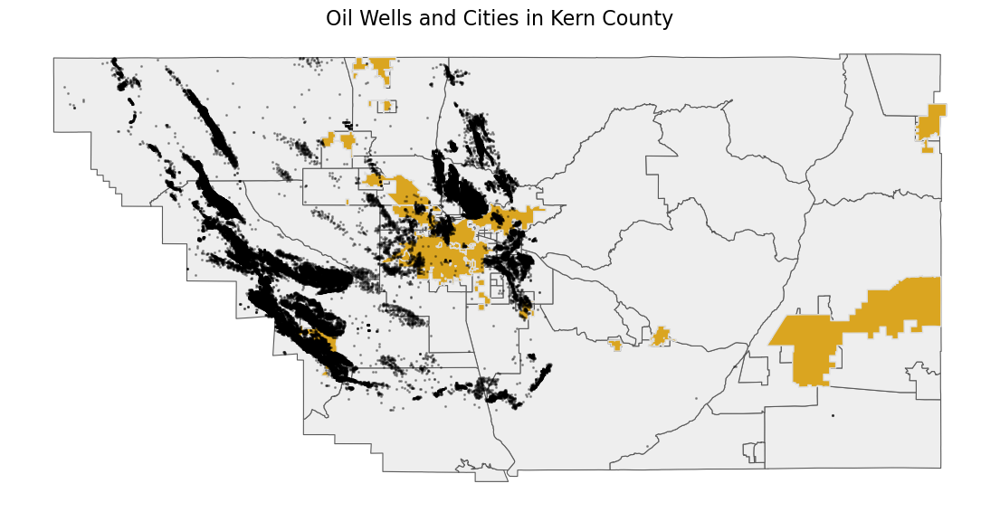

In [79]:
## mapping to see if this provides more information on the map than the "watercourse" gdf
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='#eee',
            edgecolor='#5A5A5A',
            lw=.8)
# cities
city.plot(ax=ax,
                   facecolor='#daa520',
                   edgecolor='#ddd',
                   lw=1,
                   alpha=1)
# OG wells
kern_wellsgeo.plot(ax=ax,
               marker='.',
               markersize=6,
               color='black',
               alpha=.3)

ax.axis('off')
ax.set_title("Oil Wells and Cities in Kern County",fontsize=16)

# saving
plt.savefig("wellsandcities.jpg", bbox_inches ='tight')

Now, I'll be exploring select water threat indicators with data provided from CalEnviroScreen and creating maps to get a sense of the canals in/near census tracts that have higher drinking and groundwater threats.

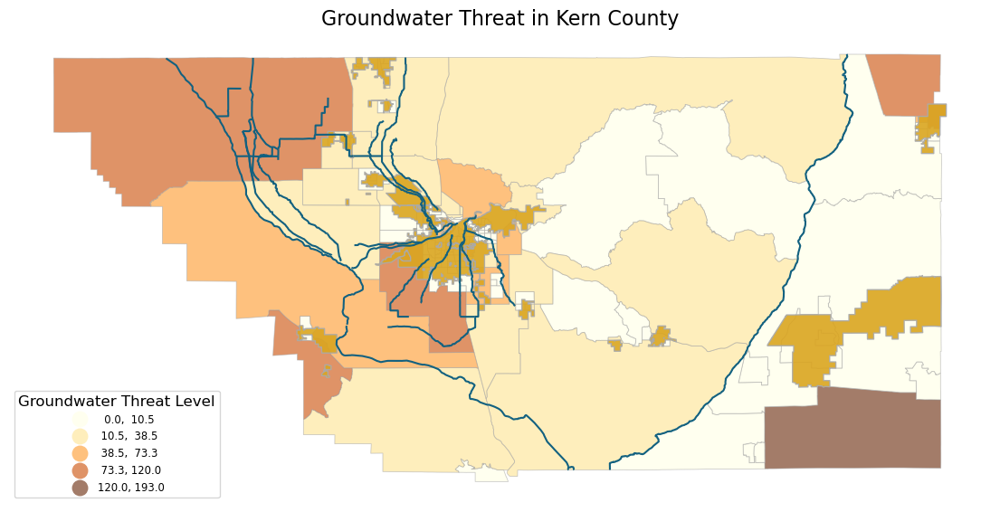

In [80]:
## overlaying watershed boundaries and ground water threat in CalEnviroScreen
fig,ax = plt.subplots(figsize=(14,12))

# Water threat + tracts
oilenv.plot(ax=ax,
            #column='DrinkWat',
            column='GWThreat',
            cmap='YlOrBr',
            scheme='NaturalBreaks',
            legend=True,
            legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
            edgecolor='#aaa',
            lw=0.6,
            alpha=0.6)
# cities
city.plot(ax=ax,
                   facecolor='#daa520',
                   edgecolor='#aaa',
                   lw=1,
                   alpha=0.9)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.5,
            color='#126180',
            alpha=1)

ax.axis('off')
ax.set_title("Groundwater Threat in Kern County",fontsize=16)
ax.get_legend().set_title("Groundwater Threat Level")


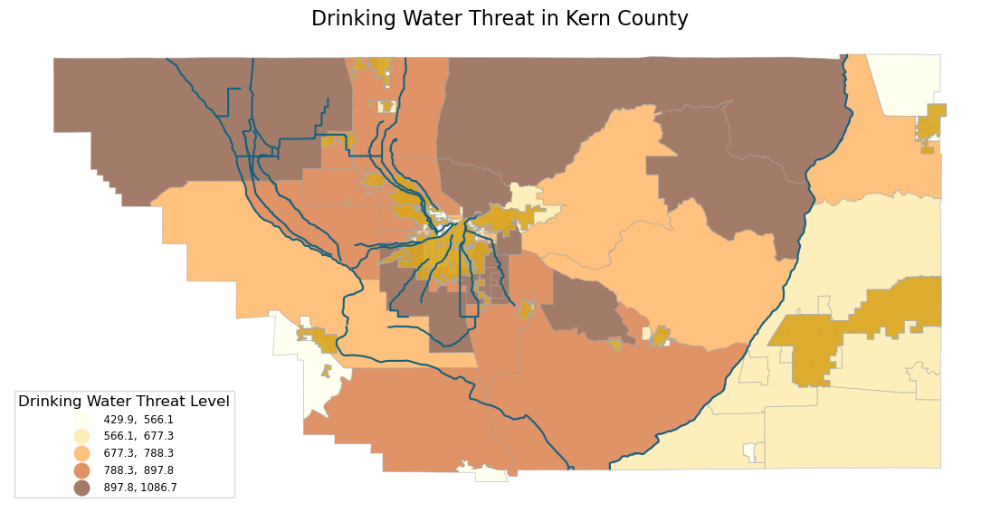

In [81]:
## overlaying watershed boundaries and drinking water threat in CalEnviroScreen
fig,ax = plt.subplots(figsize=(14,12))

# Water threat + tracts
oilenv.plot(ax=ax,
            column='DrinkWat',
            cmap='YlOrBr',
            scheme='NaturalBreaks',
            legend=True,
            legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
            edgecolor='#aaa',
            lw=0.6,
            alpha=0.6)
# cities
city.plot(ax=ax,
                   facecolor='#daa520',
                   edgecolor='#aaa',
                   lw=1,
                   alpha=0.9)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.5,
            color='#126180',
            alpha=1)

ax.axis('off')
ax.set_title("Drinking Water Threat in Kern County",fontsize=16)
ax.get_legend().set_title("Drinking Water Threat Level")

I want to create a side-by-side map so it's easier to visually compare where the groundwater and drinking water threats are concentrated.

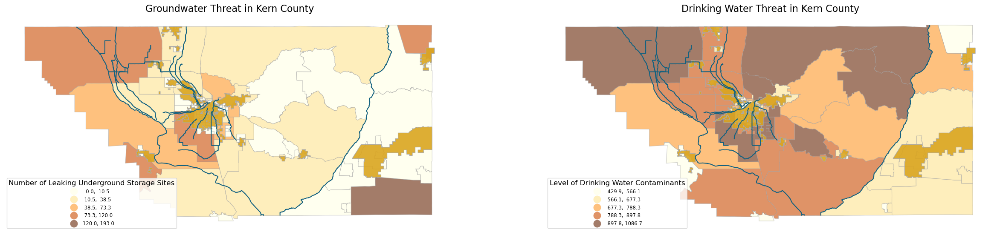

In [82]:
## side-by-side
fig, axs = plt.subplots(1, 2, figsize=(30,14), sharex=True, sharey=True)
ax1, ax2 = axs

## ax1
oilenv.plot(ax=ax1,
            column='GWThreat',
            cmap='YlOrBr',
            scheme='NaturalBreaks',
            legend=True,
            legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
            edgecolor='#aaa',
            lw=0.8,
            alpha=0.6)
# cities
city.plot(ax=ax1,
                   facecolor='#daa520',
                   edgecolor='#aaa',
                   lw=1,
                   alpha=0.9)
# canals
canals.plot(ax=ax1,
            linestyle='solid',
            linewidth=1.5,
            color='#126180',
            alpha=1)

ax1.axis('off')
ax1.set_title("Groundwater Threat in Kern County",fontsize=16)
ax1.get_legend().set_title("Number of Leaking Underground Storage Sites")

## ax2
oilenv.plot(ax=ax2,
            column='DrinkWat',
            cmap='YlOrBr',
            scheme='NaturalBreaks',
            legend=True,
            legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
            edgecolor='#aaa',
            lw=0.8,
            alpha=0.6)
# cities
city.plot(ax=ax2,
                   facecolor='#daa520',
                   edgecolor='#aaa',
                   lw=1,
                   alpha=0.9)
# canals
canals.plot(ax=ax2,
            linestyle='solid',
            linewidth=1.5,
            color='#126180',
            alpha=1)

ax2.axis('off')
ax2.set_title("Drinking Water Threat in Kern County",fontsize=16)
ax2.get_legend().set_title("Level of Drinking Water Contaminants")

# saving
plt.savefig("waterthreat.jpg", bbox_inches ='tight')

I decided to omit the "impure water bodies" indicator, since after creating the map and examining the data, it doesn't have very many recorded observations -- only 5 census tracts. There's also no documentation about the units for the values that are provided for the 5 census tracts that have recorded observations, so I can't make sense of them.

Now I want to create a couple maps that overlay the drinking and groundwater threats levels by census tract over the watershed boundaries to see if there are any patterns of interest -- which census tracts within the Tulare watershed have the highest level of threats and what that might indicate.

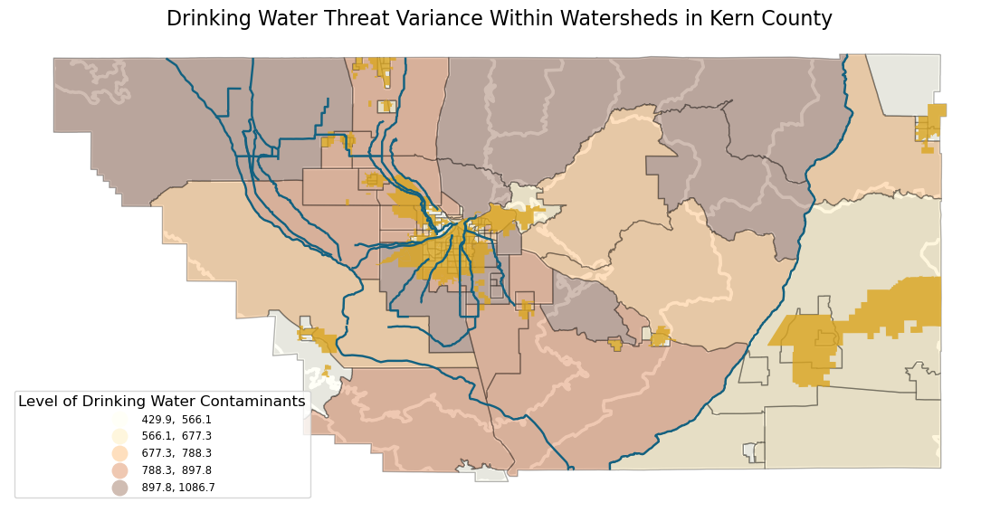

In [84]:
## overlaying watershed boundaries and water threat in CalEnviroScreen
fig,ax = plt.subplots(figsize=(14,12))

# watersheds
kernwatershed.plot(ax=ax,
                   edgecolor="white",
                   facecolor="#ddd",
                   linewidth=2.5,
                   alpha=1)

# Water threat + tracts
oilenv.plot(ax=ax,
            column='DrinkWat',
            cmap='YlOrBr',
            scheme='NaturalBreaks',
            legend=True,
            legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
            edgecolor='black',
            lw=1,
            alpha=0.3)
# cities
city.plot(ax=ax,
                   facecolor='#daa520',
                   lw=1,
                   alpha=0.8)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.75,
            color='#126180',
            alpha=1)

ax.axis('off')
ax.set_title("Drinking Water Threat Variance Within Watersheds in Kern County",fontsize=16)
ax.get_legend().set_title("Level of Drinking Water Contaminants")

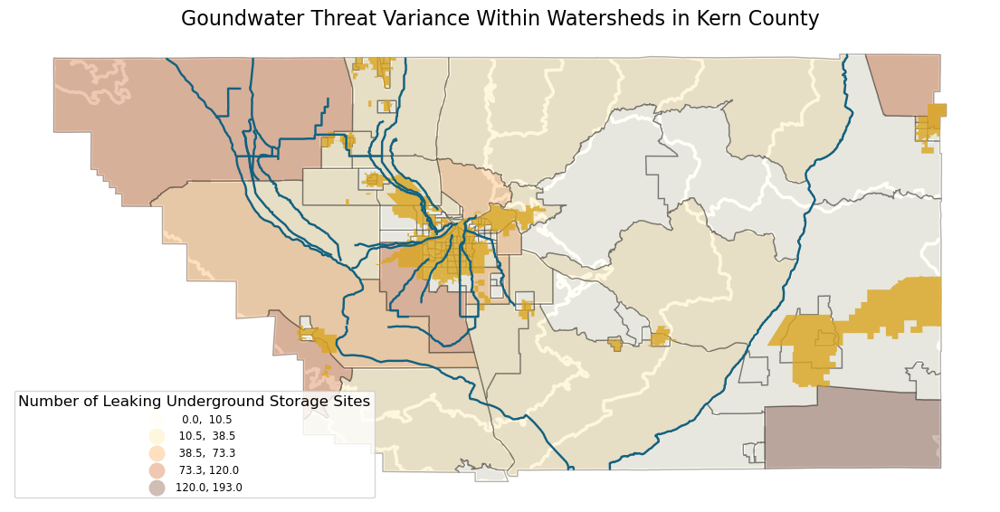

In [85]:
## overlaying watershed boundaries and ground water threat in CalEnviroScreen
fig,ax = plt.subplots(figsize=(14,12))

# watersheds
kernwatershed.plot(ax=ax,
                   edgecolor="white",
                   facecolor="#ddd",
                   linewidth=2.5,
                   alpha=1)
# Water threat + tracts
oilenv.plot(ax=ax,
            column='GWThreat',
            cmap='YlOrBr',
            scheme='NaturalBreaks',
            legend=True,
            legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
            edgecolor='black',
            lw=1,
            alpha=0.3)
# cities
city.plot(ax=ax,
                   facecolor='#daa520',
                   lw=1,
                   alpha=0.8)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.75,
            color='#126180',
            alpha=1)

ax.axis('off')
ax.set_title("Goundwater Threat Variance Within Watersheds in Kern County",fontsize=16)
ax.get_legend().set_title("Number of Leaking Underground Storage Sites")

There's a lot of variability in the drinking and groundwater threat levels by census tract within the Tulare watershed. However, the highest risks seem to be in the census tracts to the north and, predictably, closest to Bakersfield where all the canals and oil wells are most heavily concentated. Suspiciously, the census tract with over half of all the wells in the County seems to score lower threat levels than you'd expect.

## Assignment Group Summary

**Group name**: Environmental Justice In Kern County

**Members**: Yesenia Becerra, Dinah Dominguez, Melody Ng, Nick Stewart-Bloch